Đoạn code này giúp tạo một cầu nối giữa Google Colab và Google Drive, cho phép bạn dễ dàng truy cập và làm việc với các tệp tin được lưu trữ trên Drive trong môi trường lập trình trực tuyến của Google Colab.

In [ ]:
from google.colab import drive
drive.mount('/content/data')

Drive already mounted at /content/data; to attempt to forcibly remount, call drive.mount("/content/data", force_remount=True).


Chuẩn bị một DataLoader từ tập dữ liệu hình ảnh, với các bước xử lý và chuẩn bị dữ liệu cần thiết cho quá trình huấn luyện mô hình học sâu.<br>



In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import random_split
import math
import torch.utils.data as data_utils

subset_len = 500
indices = torch.arange(subset_len)

image_size = 256
batch_size = 16

transformer = transforms.Compose([
    transforms.CenterCrop(image_size),
    transforms.ToTensor() # ToTensor() changes the range of the values from [0, 255] to [0.0, 1.0]
])

cartoon_dataset = ImageFolder('/content/data/MyDrive/img/test1/', transformer)
cartoon_dataset = data_utils.Subset(cartoon_dataset, indices)
len_training_set = math.floor(len(cartoon_dataset) * 0.9)
len_valid_set = len(cartoon_dataset) - len_training_set

training_set, _ = random_split(cartoon_dataset, (len_training_set, len_valid_set))
cartoon_image_dataloader_train = DataLoader(training_set, batch_size, shuffle=True, num_workers=0)

torch.Size([3, 256, 256])
Current range: 0.0 to 1.0


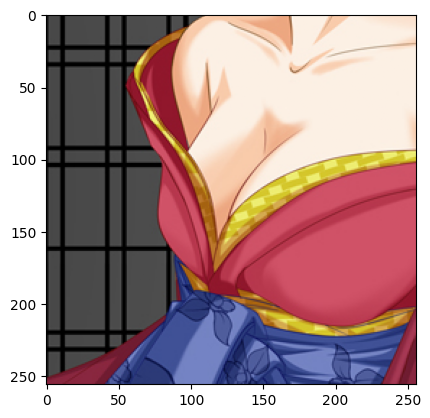

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def show_sample_image(dataloader):
  iterator = iter(dataloader)
  sample_batch, _ = next(iterator)
  first_sample_image_of_batch = sample_batch[0]
  print(first_sample_image_of_batch.size())
  print("Current range: {} to {}".format(first_sample_image_of_batch.min(), first_sample_image_of_batch.max()))
  plt.imshow(np.transpose(first_sample_image_of_batch.numpy(), (1, 2, 0)))

show_sample_image(cartoon_image_dataloader_train)

In [ ]:
smoothed_cartoon_dataset = ImageFolder('/content/data/MyDrive/img/1/', transformer)
smoothed_cartoon_dataset = data_utils.Subset(smoothed_cartoon_dataset, indices)
len_training_set = math.floor(len(smoothed_cartoon_dataset) * 0.9)
len_valid_set = len(smoothed_cartoon_dataset) - len_training_set
training_set, _ = random_split(smoothed_cartoon_dataset, (len_training_set, len_valid_set))
smoothed_cartoon_image_dataloader_train = DataLoader(training_set, batch_size, shuffle=True, num_workers=0)

In [ ]:
len_training_set

450

torch.Size([3, 256, 256])
Current range: 0.0 to 1.0


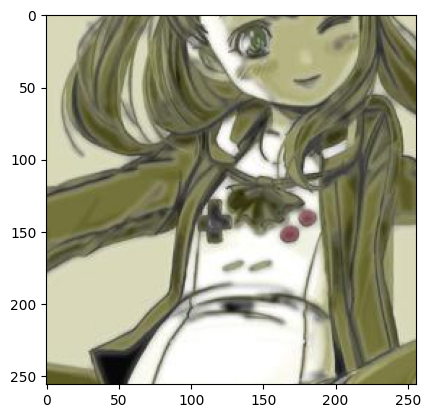

In [ ]:
show_sample_image(smoothed_cartoon_image_dataloader_train)

In [ ]:
!ln -s "/content/data/MyDrive/img/photos"  "/content/data/MyDrive/img/test1/2"

ln: failed to create symbolic link '/content/data/MyDrive/img/test1/2/photos': File exists


In [ ]:
photo_dataset = ImageFolder('/content/data/MyDrive/img/test1/2', transformer)
photo_dataset = data_utils.Subset(photo_dataset, indices)
len_training_set = math.floor(len(photo_dataset) * 0.9)
len_valid_set = len(photo_dataset) - len_training_set
training_set, validation_set = random_split(photo_dataset, (len_training_set, len_valid_set))
photo_dataloader_train = DataLoader(training_set, batch_size, shuffle=True, num_workers=0)
photo_dataloader_valid = DataLoader(validation_set, batch_size, shuffle=True, num_workers=0)

In [ ]:
len(training_set)

450

torch.Size([3, 256, 256])
Current range: 0.054901961237192154 to 0.9450980424880981


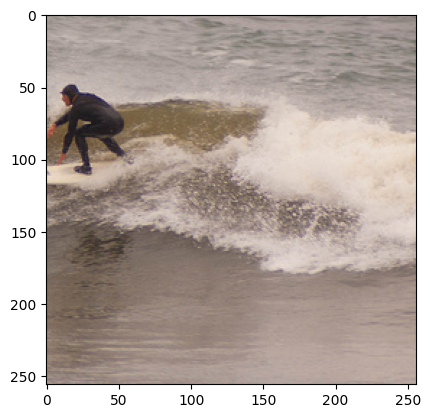

In [ ]:
show_sample_image(photo_dataloader_train)

In [ ]:
%tensorflow_version 2.x

from torch.utils.tensorboard import SummaryWriter

tensorboard_logdir = '/content/data/MyDrive/DoAntot/code/cartoonGAN/tensorboard'
writer = SummaryWriter(tensorboard_logdir)

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torch import sigmoid

class ResidualBlock(nn.Module):
  def __init__(self):
    super(ResidualBlock, self).__init__()
    self.conv_1 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.conv_2 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.norm_1 = nn.BatchNorm2d(256)
    self.norm_2 = nn.BatchNorm2d(256)

  def forward(self, x):
    output = self.norm_2(self.conv_2(F.relu(self.norm_1(self.conv_1(x)))))
    return output + x #ES

class Generator(nn.Module):
    def __init__(self):
      super(Generator, self).__init__()
      self.conv_1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=1, padding=3)
      self.norm_1 = nn.BatchNorm2d(64)

      # down-convolution #
      self.conv_2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1)
      self.conv_3 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1)
      self.norm_2 = nn.BatchNorm2d(128)

      self.conv_4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1)
      self.conv_5 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
      self.norm_3 = nn.BatchNorm2d(256)

      # residual blocks #
      residualBlocks = []
      for l in range(8):
        residualBlocks.append(ResidualBlock())
      self.res = nn.Sequential(*residualBlocks)

      # up-convolution #
      self.conv_6 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
      self.conv_7 = nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1)
      self.norm_4 = nn.BatchNorm2d(128)

      self.conv_8 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1)
      self.conv_9 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
      self.norm_5 = nn.BatchNorm2d(64)

      self.conv_10 = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=7, stride=1, padding=3)

    def forward(self, x):
      x = F.relu(self.norm_1(self.conv_1(x)))

      x = F.relu(self.norm_2(self.conv_3(self.conv_2(x))))
      x = F.relu(self.norm_3(self.conv_5(self.conv_4(x))))

      x = self.res(x)
      x = F.relu(self.norm_4(self.conv_7(self.conv_6(x))))
      x = F.relu(self.norm_5(self.conv_9(self.conv_8(x))))

      x = self.conv_10(x)

      x = sigmoid(x)

      return x

In [ ]:
G = Generator()
print(G)

Generator(
  (conv_1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (res): Sequential(
    (0): ResidualBlock(
      (conv_1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (conv_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (norm_1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [ ]:
class Discriminator(nn.Module):
  def __init__(self):
     super(Discriminator, self).__init__()
     self.conv_1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)

     self.conv_2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1)
     self.conv_3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
     self.norm_1 = nn.BatchNorm2d(128)

     self.conv_4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1)
     self.conv_5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
     self.norm_2 = nn.BatchNorm2d(256)

     self.conv_6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
     self.norm_3 = nn.BatchNorm2d(256)

     self.conv_7 = nn.Conv2d(in_channels=256, out_channels=1, kernel_size=3, stride=1, padding=1)

  def forward(self, x):
    x = F.leaky_relu(self.conv_1(x))
    x = F.leaky_relu(self.norm_1(self.conv_3(F.leaky_relu(self.conv_2(x)))), negative_slope=0.2)
    x = F.leaky_relu(self.norm_2(self.conv_5(F.leaky_relu(self.conv_4(x)))), negative_slope=0.2)
    x = F.leaky_relu(self.norm_3(self.conv_6(x)), negative_slope=0.2)
    x = self.conv_7(x)
    x = sigmoid(x)

    return x

In [ ]:

D = Discriminator()
print(D)

Discriminator(
  (conv_1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv_2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_7): Conv2d(256, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


In [ ]:
import torch

device = torch.device('cpu')

if torch.cuda.is_available():
  device = torch.device('cuda')
  print("Train on GPU.")
else:
  print("No cuda available")

G.to(device)
D.to(device)


Train on GPU.


Discriminator(
  (conv_1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv_2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_7): Conv2d(256, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [ ]:
from torchvision import models

path_to_pretrained_vgg16 = '/content/data/MyDrive/DoAntot/code/ download model VGG-16/file/vgg16_model.pth'

try:
  pretrained = torch.load(path_to_pretrained_vgg16)
  vgg16 = models.vgg16(pretrained=False)
  vgg16.load_state_dict(pretrained)
  vgg16 = vgg16.to(device)
except FileNotFoundError:
  vgg16 = models.vgg16(pretrained=True)
  torch.save(vgg16, path_to_pretrained_vgg16)
  vgg16 = vgg16.to(device) # Credits to bdlneto (https://github.com/bdlneto) https://github.com/TobiasSunderdiek/cartoon-gan/issues/5 for finding this issue and testing the new version
print(vgg16)

# due VGG16 has 5 pooling-layer, I assume conv4_4 is the 4th pooling layer
# (23): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
feature_extractor = vgg16.features[:24]
for param in feature_extractor.parameters():
  param.require_grad = False

print(feature_extractor)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
from torchvision import models
from torch.nn import BCELoss

class DiscriminatorLoss(torch.nn.Module):
  def __init__(self):
      super(DiscriminatorLoss, self).__init__()
      self.bce_loss = BCELoss()

  def forward(self, discriminator_output_of_cartoon_input,
              discriminator_output_of_cartoon_smoothed_input,
              discriminator_output_of_generated_image_input,
              epoch,
              write_to_tensorboard=False):

    return self._adversarial_loss(discriminator_output_of_cartoon_input,
                     discriminator_output_of_cartoon_smoothed_input,
                     discriminator_output_of_generated_image_input,
                     epoch,
                     write_to_tensorboard)

  def _adversarial_loss(self, discriminator_output_of_cartoon_input,
                     discriminator_output_of_cartoon_smoothed_input,
                     discriminator_output_of_generated_image_input,
                     epoch,
                     write_to_tensorboard):

    # define ones and zeros here instead within __init__ due to have same shape as input
    # due to testing different batch_sizes, sometimes the "last batch" has < batch_size elements
    actual_batch_size = discriminator_output_of_cartoon_input.size()[0]
    zeros = torch.zeros([actual_batch_size, 1, 64, 64]).to(device)
    ones = torch.ones([actual_batch_size, 1, 64, 64]).to(device)

    d_loss_cartoon = self.bce_loss(discriminator_output_of_cartoon_input, ones)
    d_loss_cartoon_smoothed = self.bce_loss(discriminator_output_of_cartoon_smoothed_input, zeros)
    d_loss_generated_input = self.bce_loss(discriminator_output_of_generated_image_input, zeros)

    d_loss = d_loss_cartoon + d_loss_cartoon_smoothed + d_loss_generated_input

    if write_to_tensorboard:
      writer.add_scalar('d_loss_cartoon', d_loss_cartoon,epoch)
      writer.add_scalar('d_loss_cartoon_smoothed', d_loss_cartoon_smoothed, epoch)
      writer.add_scalar('d_loss_generated_input', d_loss_generated_input, epoch)
      writer.add_scalar('d_loss', d_loss, epoch)

    return d_loss

In [ ]:
class GeneratorLoss(torch.nn.Module):
  def __init__(self):
      super(GeneratorLoss, self).__init__()
      self.w = 0.000005
      self.bce_loss = BCELoss()
      self.feature_extractor = vgg16.features[:24]
      for param in self.feature_extractor.parameters():
        param.require_grad = False

  def forward(self, discriminator_output_of_generated_image_input,
              generator_input,
              generator_output,
              epoch,
              is_init_phase=False,
              write_to_tensorboard=False):
    if is_init_phase:
      g_content_loss = self._content_loss(generator_input, generator_output)
      g_adversarial_loss = 0.0
      g_loss = g_content_loss
    else:
      g_adversarial_loss = self._adversarial_loss_generator_part_only(discriminator_output_of_generated_image_input)
      g_content_loss = self._content_loss(generator_input, generator_output)
      g_loss = g_adversarial_loss + self.w * g_content_loss

    if write_to_tensorboard:
      writer.add_scalar('g_adversarial_loss', g_adversarial_loss, epoch)
      writer.add_scalar('g_content_loss', g_content_loss, epoch)
      writer.add_scalar('g_loss', g_loss, epoch)

    return g_loss

  def _adversarial_loss_generator_part_only(self, discriminator_output_of_generated_image_input):
    actual_batch_size = discriminator_output_of_generated_image_input.size()[0]
    ones = torch.ones([actual_batch_size, 1, 64, 64]).to(device)
    return self.bce_loss(discriminator_output_of_generated_image_input, ones)

  def _content_loss(self, generator_input, generator_output):
    return (self.feature_extractor(generator_output) - self.feature_extractor(generator_input)).norm(p=1)

In [ ]:
discriminatorLoss = DiscriminatorLoss()
generatorLoss = GeneratorLoss()

In [ ]:
import torch.optim as optim

lr = 0.0002
beta1 = 0.5
beta2 = 0.999

d_optimizer = optim.Adam(D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(G.parameters(), lr, [beta1, beta2])

In [ ]:
intermediate_results_training_path = "/content/data/MyDrive/img/intermediate_results/training"

In [ ]:
def save_training_result(input, output):
  # input/output has batch-size number of images, get first one and detach from tensor
  image_input = input[0].detach().cpu().numpy()
  image_output = output[0].detach().cpu().numpy()
  # transponse image from torch.Size([3, 256, 256]) to (256, 256, 3)
  image_input = np.transpose(image_input, (1, 2, 0))
  image_output = np.transpose(image_output, (1, 2, 0))

  # generate filenames as timestamp, this orders the output by time
  filename = str(int(time.time()))
  path_input = intermediate_results_training_path + filename + "_input.jpg"
  path_output = intermediate_results_training_path + filename + ".jpg"
  plt.imsave(path_input, image_input)
  plt.imsave(path_output, image_output)

In [ ]:
def write_model_weights_and_bias_to_tensorboard(prefix, state_dict, epoch):
  for param in state_dict:
      writer.add_histogram(f"{prefix}_{param}", state_dict[param], epoch)

In [ ]:
import time

def train(_num_epochs, checkpoint_dir, best_valid_loss, epochs_already_done, losses, validation_losses):
  init_epochs = 10
  print_every = 100
  start_time = time.time()

  for epoch in range(_num_epochs - epochs_already_done):
    epoch = epoch + epochs_already_done

    for index, ((photo_images, _), (smoothed_cartoon_images, _), (cartoon_images, _)) in enumerate(zip(photo_dataloader_train, smoothed_cartoon_image_dataloader_train, cartoon_image_dataloader_train)):
      batch_size = photo_images.size(0)
      photo_images = photo_images.to(device)
      smoothed_cartoon_images = smoothed_cartoon_images.to(device)
      cartoon_images = cartoon_images.to(device)

      # train the discriminator
      d_optimizer.zero_grad()

      d_of_cartoon_input = D(cartoon_images)
      d_of_cartoon_smoothed_input = D(smoothed_cartoon_images)
      d_of_generated_image_input = D(G(photo_images))

      write_only_one_loss_from_epoch_not_every_batch_loss = (index == 0)

      d_loss = discriminatorLoss(d_of_cartoon_input,
                                 d_of_cartoon_smoothed_input,
                                 d_of_generated_image_input,
                                 epoch,
                                 write_to_tensorboard=write_only_one_loss_from_epoch_not_every_batch_loss)

      d_loss.backward()
      d_optimizer.step()

      # train the generator
      g_optimizer.zero_grad()

      g_output = G(photo_images)

      d_of_generated_image_input = D(g_output)

      if epoch < init_epochs:
        # init
        init_phase = True
      else:
        # train
        init_phase = False

      g_loss = generatorLoss(d_of_generated_image_input,
                              photo_images,
                              g_output,
                              epoch,
                              is_init_phase=init_phase,
                              write_to_tensorboard=write_only_one_loss_from_epoch_not_every_batch_loss)

      g_loss.backward()
      g_optimizer.step()

      if (index % print_every) == 0:
        losses.append((d_loss.item(), g_loss.item()))
        now = time.time()
        current_run_time = now - start_time
        start_time = now
        print("Epoch {}/{} | d_loss {:6.4f} | g_loss {:6.4f} | time {:2.0f}s | total no. of losses {}".format(epoch+1, _num_epochs, d_loss.item(), g_loss.item(), current_run_time, len(losses)))

    # write to tensorboard
      #write_model_weights_and_bias_to_tensorboard('D', D.state_dict(), epoch)
      #write_model_weights_and_bias_to_tensorboard('G', G.state_dict(), epoch)
    # save some intermediate results during training
    save_training_result(photo_images, g_output)

    # validate
    with torch.no_grad():
      D.eval()
      G.eval()

      for batch_index, (photo_images, _) in enumerate(photo_dataloader_valid):
        photo_images = photo_images.to(device)

        g_output = G(photo_images)
        d_of_generated_image_input = D(g_output)
        g_valid_loss = generatorLoss(d_of_generated_image_input,
                                      photo_images,
                                      g_output,
                                      epoch,
                                      is_init_phase=init_phase,
                                      write_to_tensorboard=write_only_one_loss_from_epoch_not_every_batch_loss)

        if batch_index % print_every == 0:
          validation_losses.append(g_valid_loss.item())
          now = time.time()
          current_run_time = now - start_time
          start_time = now
          print("Epoch {}/{} | validation loss {:6.4f} | time {:2.0f}s | total no. of losses {}".format(epoch+1, _num_epochs, g_valid_loss.item(), current_run_time, len(validation_losses)))

    D.train()
    G.train()

    if(g_valid_loss.item() < best_valid_loss):
      print("Generator loss improved from {} to {}".format(best_valid_loss, g_valid_loss.item()))
      best_valid_loss = g_valid_loss.item()

    # save checkpoint
    checkpoint = {'g_valid_loss': g_valid_loss.item(),
                  'best_valid_loss': best_valid_loss,
                  'losses': losses,
                  'validation_losses': validation_losses,
                  'last_epoch': epoch+1,
                  'd_state_dict': D.state_dict(),
                  'g_state_dict': G.state_dict(),
                  'd_optimizer_state_dict': d_optimizer.state_dict(),
                  'g_optimizer_state_dict': g_optimizer.state_dict()
                }
    print("Save checkpoint for validation loss of {}".format(g_valid_loss.item()))
    torch.save(checkpoint, checkpoint_dir + '/checkpoint_epoch_{:03d}.pth'.format(epoch+1))
    if(best_valid_loss == g_valid_loss.item()):
      print("Overwrite best checkpoint")
      torch.save(checkpoint, checkpoint_dir + '/best_checkpoint.pth')

  return losses, validation_losses

In [ ]:
from os import listdir

checkpoint_dir = '/content/data/MyDrive/img/checkpoints'
checkpoints = listdir(checkpoint_dir)
num_epochs = 90 + 10 # training + init phase
epochs_already_done = 0
best_valid_loss = math.inf
losses = []
validation_losses = []

if(len(checkpoints) > 0):
  last_checkpoint = sorted(checkpoints)[-1]
  checkpoint = torch.load(checkpoint_dir + '/' + last_checkpoint, map_location=torch.device(device))
  best_valid_loss = checkpoint['best_valid_loss']
  epochs_already_done = checkpoint['last_epoch']
  losses = checkpoint['losses']
  validation_losses = checkpoint['validation_losses']

  D.load_state_dict(checkpoint['d_state_dict'])
  G.load_state_dict(checkpoint['g_state_dict'])
  d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])
  g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
  print('Load checkpoint {} with g_valid_loss {}, best_valid_loss {}, {} epochs and total no of losses {}'.format(last_checkpoint, checkpoint['g_valid_loss'], best_valid_loss, epochs_already_done, len(losses)))


In [ ]:
losses, validation_losses = train(num_epochs, checkpoint_dir, best_valid_loss, epochs_already_done, losses, validation_losses)

Epoch 1/100 | d_loss 2.1679 | g_loss 1172238.0000 | time 11s | total no. of losses 1
Epoch 1/100 | validation loss 991199.1250 | time 266s | total no. of losses 1
Generator loss improved from inf to 99126.7109375
Save checkpoint for validation loss of 99126.7109375
Overwrite best checkpoint
Epoch 2/100 | d_loss 1.5920 | g_loss 1074172.7500 | time  6s | total no. of losses 2
Epoch 2/100 | validation loss 1065992.3750 | time 80s | total no. of losses 2
Save checkpoint for validation loss of 151726.75
Epoch 3/100 | d_loss 1.5889 | g_loss 1252103.8750 | time  5s | total no. of losses 3
Epoch 3/100 | validation loss 1096282.3750 | time 80s | total no. of losses 3
Save checkpoint for validation loss of 140034.25
Epoch 4/100 | d_loss 0.9871 | g_loss 1070491.2500 | time  5s | total no. of losses 4
Epoch 4/100 | validation loss 888530.2500 | time 80s | total no. of losses 4
Save checkpoint for validation loss of 168468.4375
Epoch 5/100 | d_loss 1.0340 | g_loss 930144.1250 | time  5s | total no.

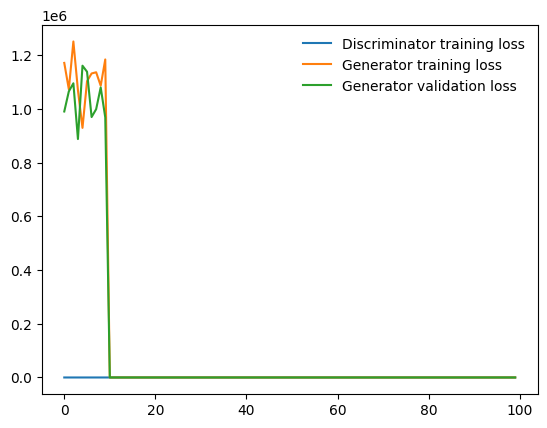

In [ ]:
%matplotlib inline
%config InlineBackend.figure.format = 'retina'

import matplotlib.pyplot as plt

d_losses = [x[0] for x in losses]
g_losses = [x[1] for x in losses]
plt.plot(d_losses, label='Discriminator training loss')
plt.plot(g_losses, label='Generator training loss')
plt.plot(validation_losses, label='Generator validation loss')
plt.legend(frameon=False)

In [ ]:
checkpoint = torch.load(checkpoint_dir + '/best_checkpoint.pth', map_location=torch.device(device))
G_inference = Generator()
G_inference.load_state_dict(checkpoint['g_state_dict'])

<All keys matched successfully>

In [ ]:
%load_ext tensorboard
%tensorboard --logdir='/content/data/MyDrive/DoAntot/code/cartoonGAN/tensorboard'

<IPython.core.display.Javascript object>

tensor([[[0.4737, 0.4300, 0.4719,  ..., 0.4491, 0.4881, 0.4578],
         [0.4947, 0.4637, 0.5171,  ..., 0.5205, 0.4983, 0.4385],
         [0.4420, 0.4589, 0.4984,  ..., 0.4984, 0.5411, 0.4711],
         ...,
         [0.4746, 0.4913, 0.4589,  ..., 0.5397, 0.4608, 0.4627],
         [0.4634, 0.4493, 0.4938,  ..., 0.4903, 0.5318, 0.4894],
         [0.4770, 0.4638, 0.4773,  ..., 0.5140, 0.4888, 0.5105]],

        [[0.4637, 0.5176, 0.4617,  ..., 0.4527, 0.4227, 0.4853],
         [0.5317, 0.4546, 0.5339,  ..., 0.3952, 0.4304, 0.4187],
         [0.4992, 0.4973, 0.4540,  ..., 0.4449, 0.4156, 0.4743],
         ...,
         [0.4870, 0.5194, 0.5637,  ..., 0.4445, 0.4975, 0.4370],
         [0.5035, 0.4777, 0.4762,  ..., 0.4973, 0.4721, 0.5442],
         [0.5031, 0.4778, 0.5180,  ..., 0.4775, 0.5080, 0.4739]],

        [[0.4607, 0.4673, 0.5044,  ..., 0.5069, 0.5076, 0.5051],
         [0.4498, 0.4844, 0.5051,  ..., 0.4837, 0.5136, 0.4486],
         [0.4555, 0.4622, 0.4668,  ..., 0.5123, 0.5239, 0.

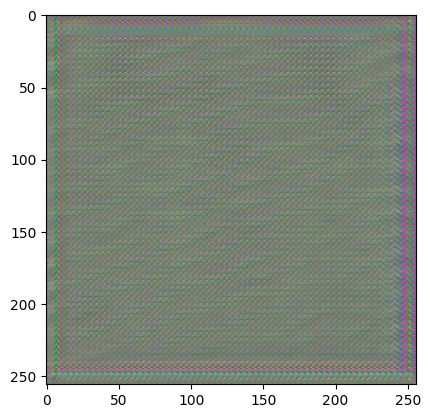

In [ ]:
test_images = next(iter(photo_dataloader_valid))[0]
result_images_best_checkpoint = G_inference(test_images)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_images = test_images.to(device)

result_images_checkpoint_after_210_epochs = G(test_images)

print(result_images_best_checkpoint[0])
plt.imshow(np.transpose(result_images_best_checkpoint[0].detach().numpy(), (1, 2, 0)))


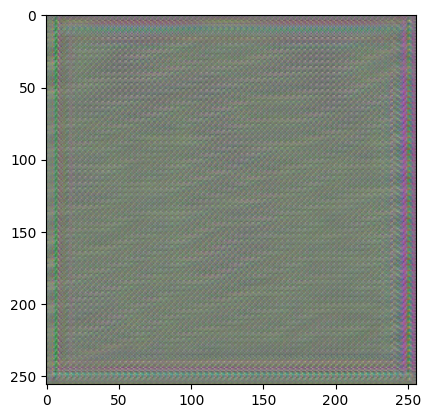

In [ ]:
plt.imshow(np.transpose(result_images_checkpoint_after_210_epochs[0].cpu().detach().numpy(), (1, 2, 0)))


In [ ]:

generator_release = {'last_epoch': 100+1,
                    'g_state_dict': G.state_dict(),
                   }
print("Save generator release")
torch.save(generator_release, checkpoint_dir + '/generator_release.pth')



Save generator release


In [ ]:
checkpoint_dir

'/content/data/MyDrive/img/checkpoints'

## Inference

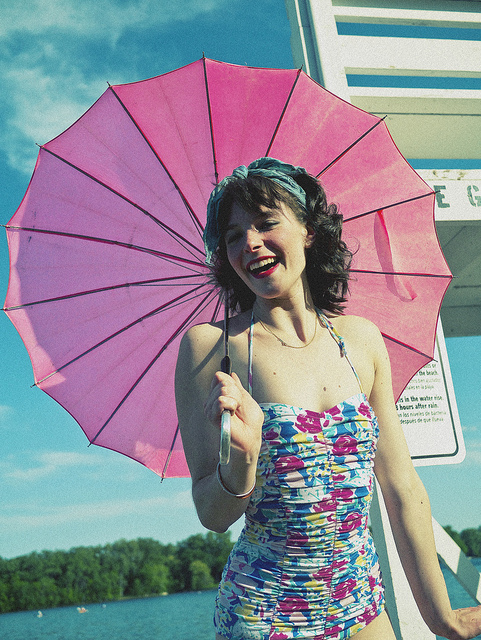

In [ ]:
from PIL import Image
img =  Image.open('/content/data/MyDrive/img/photos/000000000036.jpg')
img

In [ ]:
test_trans = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor() # ToTensor() changes the range of the values from [0, 255] to [0.0, 1.0]
])
test_input = test_trans(img)

In [ ]:
test_input = test_input.to(device)

In [ ]:
G.load_state_dict(torch.load('/content/data/MyDrive/DoAntot/code/File cuối /generator_release/generator_latest.pth')['g_state_dict'])

<All keys matched successfully>

In [ ]:
test_input.unsqueeze(0).shape

torch.Size([1, 3, 256, 256])

In [ ]:
test_output = G(test_input.unsqueeze(0)).cpu().detach().numpy()[0] * 256

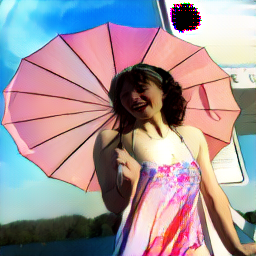

In [ ]:
Image.fromarray(test_output.astype(np.uint8).transpose(1,2,0))